# Scanpy-Squidpy Xenium Pancreas

https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/tutorial_xenium.html#analyze-xenium-data

In [1]:
import pandas as pd
import scanpy as sc
import squidpy as sq
from spatialdata_io import xenium
import celldega as dega

/Users/feni/Documents/celldega/dega/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(


/Users/feni/Documents/celldega/dega/lib/python3.12/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


/Users/feni/Documents/celldega/dega/lib/python3.12/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
xenium_path = '../../../notebooks/data/xenium_data/Xenium_V1_human_Pancreas_FFPE_outs/'
zarr_path = '../../../notebooks/data/xenium_data/Xenium_V1_human_Pancreas_FFPE_outs/Xenium_V1_human_Pancreas_FFPE_outs.zarr'

# Pre-Process, Cluster, and UMAP

In [3]:
sdata = xenium(xenium_path)

INFO     reading ../../../notebooks/data/xenium_data/Xenium_V1_human_Pancreas_FFPE_outs/cell_feature_matrix.h5     


/var/folders/8d/jxpy9rd10j7fp2rcj_s5sz3c0000gq/T/ipykernel_90707/1221898808.py:1: DeprecationWarning: The default value of `cells_as_circles` will change to `False` in the next release. Please pass `True` explicitly to maintain the current behavior.
  sdata = xenium(xenium_path)


In [4]:
adata = sdata.tables["table"]
adata

AnnData object with n_obs × n_vars = 140702 × 377
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'z_level', 'nucleus_count', 'cell_labels'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [5]:
del sdata

### Filter Cells

In [6]:
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)

/Users/feni/Documents/celldega/dega/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


### UMAP and Cluster

In [7]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

IOStream.flush timed out


IOStream.flush timed out


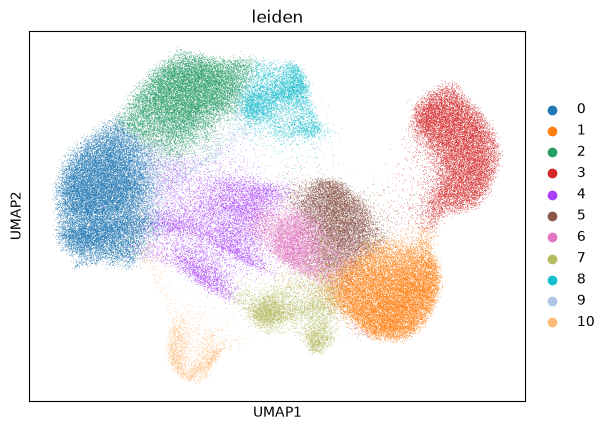

In [8]:
sc.pl.umap(
    adata,
    color=[

        "leiden",
    ],
    wspace=0.4,
)

/Users/feni/Documents/celldega/dega/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


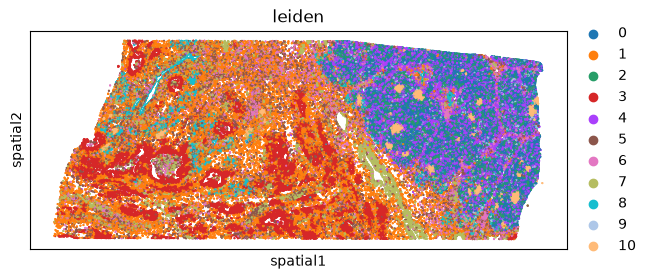

In [9]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
    ],
    wspace=0.4,
)

In [10]:
adata.write_h5ad('../../../notebooks/data/xenium_data/Xenium_V1_human_Pancreas_FFPE_outs.h5ad')

## Visualize using Celldega

In [11]:
base_url = 'https://raw.githubusercontent.com/broadinstitute/celldega_Xenium_human_Pancreas_FFPE/main/Landscape_Xenium_V1_human_Pancreas_FFPE_outs_webp'

In [12]:
landscape = dega.viz.Landscape(
    technology='Xenium', 
    base_url = base_url,
    height=600,
    adata=adata,
    landscape_state='umap'
)

In [13]:
mat = dega.clust.Matrix(adata, row_attr=['n_cells'], col_attr=['cell_area'])
mat.downsample_to(category='leiden')
mat.norm(axis='row', by='zscore')
mat.clust()
cgm = dega.viz.Clustergram(matrix=mat, width=500, height=500)

/Users/feni/Documents/celldega/src/celldega/clust/matrix.py:354: UserWarning: Large matrix (122678 x 377). Consider filtering.
  self.load_adata(data, col_attr=col_attr, row_attr=row_attr)


In [22]:
dega.viz.landscape_clustergram(landscape, cgm)

## Squidpy

In [15]:
sq.gr.spatial_neighbors(adata, coord_type="generic", delaunay=True)

In [16]:
sq.gr.nhood_enrichment(adata, cluster_key="leiden")

  0%|          | 0/1000 [00:00<?, ?/s]

/Users/feni/Documents/celldega/dega/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(


/Users/feni/Documents/celldega/dega/lib/python3.12/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [17]:
# Extract the z-score matrix from Squidpy output
z = adata.uns["leiden_nhood_enrichment"]["zscore"]

# Convert it to a DataFrame with labeled index and columns
df = pd.DataFrame(
    z,
    index=adata.obs["leiden"].cat.categories,
    columns=adata.obs["leiden"].cat.categories,
)


In [18]:
mat_sq = dega.clust.Matrix(df)
mat_sq.clust()
cgm_sq = dega.viz.Clustergram(matrix=mat_sq, width=500, height=500)

In [19]:
landscape_2 = dega.viz.Landscape(
    technology='Xenium', 
    base_url = base_url,
    height=600,
    adata=adata
)

In [20]:
dega.viz.landscape_clustergram(landscape_2, cgm_sq)